In [1]:
import os
import sys
from pathlib import Path

def setup_project_imports(include_direct_imports=False):
    """
    Sets up the Python path to allow imports from project root.
    Args:
        include_direct_imports: If True, allows importing without the scripts/agents prefix
    """
    # Get the notebook's directory and project root
    current_dir = Path(os.getcwd())
    project_root = str(current_dir.parent)
    scripts_dir = os.path.join(project_root, 'scripts')
    
    # Clean up path
    for path in [str(current_dir), project_root, scripts_dir]:
        if path in sys.path:
            sys.path.remove(path)
    
    # Add paths
    sys.path.insert(0, project_root)
    if include_direct_imports:
        sys.path.insert(0, scripts_dir)  # This allows direct imports
    
    print("✅ Import paths configured:")
    if include_direct_imports:
        print("   You can use: from items import Item")
    print("   You can use: from scripts.items import Item")

# Run setup with direct imports enabled
setup_project_imports(include_direct_imports=True)

✅ Import paths configured:
   You can use: from items import Item
   You can use: from scripts.items import Item


In [2]:
# imports

import os
import re
import math
import json
from tqdm import tqdm
import random
from dotenv import load_dotenv
from huggingface_hub import login
import numpy as np
import pickle
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
import chromadb
from items import Item 
from sklearn.manifold import TSNE
import plotly.graph_objects as go

In [3]:
# environment

load_dotenv()
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY', 'your-key-if-not-using-env')
os.environ['HF_TOKEN'] = os.getenv('HF_TOKEN', 'your-key-if-not-using-env')
DB = "products_vectorstore"

In [4]:
# Log in to HuggingFace
import os

def load_env_file():
    env_path = os.path.join(os.path.dirname(os.getcwd()), '.env')
    with open(env_path) as f:
        for line in f:
            if line.strip() and not line.startswith('#'):
                key, value = line.strip().split('=', 1)
                os.environ[key.strip()] = value.strip()

# Load the environment variables
load_env_file()

# Now you can access HF_TOKEN
hf_token = os.environ['HF_TOKEN']
login(hf_token, add_to_git_credential=True)

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [28]:
# With train.pkl in this folder, you can run this:

with open('train.pkl', 'rb') as file:
    train = pickle.load(file)

In [29]:
train[0].prompt

'How much does this cost to the nearest dollar?\n\nDelphi FG0166 Fuel Pump Module\nDelphi brings 80 years of OE Heritage into each Delphi pump, ensuring quality and fitment for each Delphi part. Part is validated, tested and matched to the right vehicle application Delphi brings 80 years of OE Heritage into each Delphi assembly, ensuring quality and fitment for each Delphi part Always be sure to check and clean fuel tank to avoid unnecessary returns Rigorous OE-testing ensures the pump can withstand extreme temperatures Brand Delphi, Fit Type Vehicle Specific Fit, Dimensions LxWxH 19.7 x 7.7 x 5.1 inches, Weight 2.2 Pounds, Auto Part Position Unknown, Operation Mode Mechanical, Manufacturer Delphi, Model FUEL PUMP, Dimensions 19.7\n\nPrice is $227.00'

Now create a Chroma Datastore

In [30]:
client = chromadb.PersistentClient(path=DB)

In [31]:
# Check if the collection exists and delete it if it does
collection_name = "products"
existing_collection_names = [collection.name for collection in client.list_collections()]
if collection_name in existing_collection_names:
    client.delete_collection(collection_name)
    print(f"Deleted existing collection: {collection_name}")

collection = client.create_collection(collection_name)

The all-MiniLM is a very useful model from HuggingFace that maps sentences & paragraphs to a 384 dimensional dense vector space and is ideal for tasks like semantic search.

https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2

It can run pretty quickly locally.

In [32]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [33]:
# Pass in a list of texts, get back a numpy array of vectors

vector = model.encode(["Well hi there"])[0]

In [34]:
vector

array([-9.46715772e-02,  4.27620076e-02,  5.51620498e-02, -5.10970887e-04,
        1.16202980e-02, -6.80130422e-02,  2.76405867e-02,  6.06974587e-02,
        2.88531017e-02, -1.74128339e-02, -4.94346246e-02,  2.30993051e-02,
       -1.28614437e-02, -4.31402586e-02,  2.17509698e-02,  4.26548198e-02,
        5.10500371e-02, -7.79727101e-02, -1.23247243e-01,  3.67455892e-02,
        4.54119081e-03,  9.47938412e-02, -5.53098843e-02,  1.70641653e-02,
       -2.92872209e-02, -4.47124578e-02,  2.06784271e-02,  6.39320314e-02,
        2.27427725e-02,  4.87789586e-02, -2.33500893e-03,  4.72859032e-02,
       -2.86259297e-02,  2.30624489e-02,  2.45130286e-02,  3.95681411e-02,
       -4.33176868e-02, -1.02316663e-01,  2.79874611e-03,  2.39304528e-02,
        1.61556639e-02, -8.99080746e-03,  2.07256041e-02,  6.40123039e-02,
        6.89179078e-02, -6.98361844e-02,  2.89758621e-03, -8.10989439e-02,
        1.71122830e-02,  2.50659091e-03, -1.06529087e-01, -4.87733483e-02,
       -1.67762171e-02, -

In [35]:
def description(item):
    text = item.prompt.replace("How much does this cost to the nearest dollar?\n\n", "")
    return text.split("\n\nPrice is $")[0]

In [36]:
description(train[0])

'Delphi FG0166 Fuel Pump Module\nDelphi brings 80 years of OE Heritage into each Delphi pump, ensuring quality and fitment for each Delphi part. Part is validated, tested and matched to the right vehicle application Delphi brings 80 years of OE Heritage into each Delphi assembly, ensuring quality and fitment for each Delphi part Always be sure to check and clean fuel tank to avoid unnecessary returns Rigorous OE-testing ensures the pump can withstand extreme temperatures Brand Delphi, Fit Type Vehicle Specific Fit, Dimensions LxWxH 19.7 x 7.7 x 5.1 inches, Weight 2.2 Pounds, Auto Part Position Unknown, Operation Mode Mechanical, Manufacturer Delphi, Model FUEL PUMP, Dimensions 19.7'

In [40]:
len(train)

400000

In [42]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# Load the data
with open('train.pkl', 'rb') as file:
    train = pickle.load(file)

# Get current distribution of categories
categories = [item.category for item in train]
unique_categories, counts = np.unique(categories, return_counts=True)
print("Original distribution:")
for cat, count in zip(unique_categories, counts):
    print(f"{cat}: {count} ({count/len(train)*100:.2f}%)")

# Create stratified sample of 100k samples
_, train = train_test_split(
    train,
    test_size=100000/len(train),
    stratify=categories,
    random_state=42
)

# Verify new distribution
new_categories = [item.category for item in train]
unique_new, new_counts = np.unique(new_categories, return_counts=True)
print("\nNew distribution (100k samples):")
for cat, count in zip(unique_new, new_counts):
    print(f"{cat}: {count} ({count/len(train)*100:.2f}%)")

print(f"\nNew dataset size: {len(train)}")

Original distribution:
Appliances: 4681 (1.17%)
Automotive: 138897 (34.72%)
Cell_Phones_and_Accessories: 8592 (2.15%)
Electronics: 80009 (20.00%)
Musical_Instruments: 17498 (4.37%)
Office_Products: 24451 (6.11%)
Tools_and_Home_Improvement: 95593 (23.90%)
Toys_and_Games: 30279 (7.57%)

New distribution (100k samples):
Appliances: 1170 (1.17%)
Automotive: 34724 (34.72%)
Cell_Phones_and_Accessories: 2148 (2.15%)
Electronics: 20002 (20.00%)
Musical_Instruments: 4375 (4.38%)
Office_Products: 6113 (6.11%)
Tools_and_Home_Improvement: 23898 (23.90%)
Toys_and_Games: 7570 (7.57%)

New dataset size: 100000


In [43]:
for i in tqdm(range(0, len(train), 1000)):
    documents = [description(item) for item in train[i: i+1000]]
    vectors = model.encode(documents).astype(float).tolist()
    metadatas = [{"category": item.category, "price": item.price} for item in train[i: i+1000]]
    ids = [f"doc_{j}" for j in range(i, i+1000)]
    collection.add(
        ids=ids,
        documents=documents,
        embeddings=vectors,
        metadatas=metadatas
    )

  0%|          | 0/100 [00:00<?, ?it/s]Insert of existing embedding ID: doc_0
Insert of existing embedding ID: doc_1
Insert of existing embedding ID: doc_2
Insert of existing embedding ID: doc_3
Insert of existing embedding ID: doc_4
Insert of existing embedding ID: doc_5
Insert of existing embedding ID: doc_6
Insert of existing embedding ID: doc_7
Insert of existing embedding ID: doc_8
Insert of existing embedding ID: doc_9
Insert of existing embedding ID: doc_10
Insert of existing embedding ID: doc_11
Insert of existing embedding ID: doc_12
Insert of existing embedding ID: doc_13
Insert of existing embedding ID: doc_14
Insert of existing embedding ID: doc_15
Insert of existing embedding ID: doc_16
Insert of existing embedding ID: doc_17
Insert of existing embedding ID: doc_18
Insert of existing embedding ID: doc_19
Insert of existing embedding ID: doc_20
Insert of existing embedding ID: doc_21
Insert of existing embedding ID: doc_22
Insert of existing embedding ID: doc_23
Insert of e

visualize in 2D using TSNE

In [5]:
MAXIMUM_DATAPOINTS = 10_000

In [6]:
DB = "products_vectorstore"
client = chromadb.PersistentClient(path=DB)

In [7]:
collection = client.get_or_create_collection('products')

In [8]:
CATEGORIES = ['Appliances', 'Automotive', 'Cell_Phones_and_Accessories', 'Electronics','Musical_Instruments', 'Office_Products', 'Tools_and_Home_Improvement', 'Toys_and_Games']
COLORS = ['red', 'blue', 'brown', 'orange', 'yellow', 'green' , 'purple', 'cyan']

In [9]:
# Prework
result = collection.get(include=['embeddings', 'documents', 'metadatas'], limit=MAXIMUM_DATAPOINTS)
vectors = np.array(result['embeddings'])
documents = result['documents']
categories = [metadata['category'] for metadata in result['metadatas']]
colors = [COLORS[CATEGORIES.index(c)] for c in categories]

In [10]:
# Let's try a 2D chart

tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
reduced_vectors = tsne.fit_transform(vectors)

In [11]:

# Create the 2D scatter plot
fig = go.Figure(data=[go.Scatter(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    mode='markers',
    marker=dict(size=3, color=colors, opacity=0.7),
)])

fig.update_layout(
    title='2D Chroma Vectorstore Visualization',
    scene=dict(xaxis_title='x', yaxis_title='y'),
    width=1200,
    height=800,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

# Let's try 3D!

In [12]:
tsne = TSNE(n_components=3, random_state=42, n_jobs=-1)
reduced_vectors = tsne.fit_transform(vectors)

In [13]:

# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    z=reduced_vectors[:, 2],
    mode='markers',
    marker=dict(size=3, color=colors, opacity=0.7),
)])

fig.update_layout(
    title='3D Chroma Vector Store Visualization',
    scene=dict(xaxis_title='x', yaxis_title='y', zaxis_title='z'),
    width=1200,
    height=800,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

build and test a RAG pipeline with GPT-4o-mini

In [14]:
from openai import OpenAI
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
import chromadb
from items import Item
from testing import Tester

In [15]:
openai = OpenAI()

In [16]:
# Load in the test pickle file
# See the section "Back to the PKL files" in the day2.0 notebook
# for instructions on obtaining this test.pkl file

with open('test.pkl', 'rb') as file:
    test = pickle.load(file)

In [18]:
def make_context(similars, prices):
    message = "To provide some context, here are some other items that might be similar to the item you need to estimate.\n\n"
    for similar, price in zip(similars, prices):
        message += f"Potentially related product:\n{similar}\nPrice is ${price:.2f}\n\n"
    return message

In [19]:
def messages_for(item, similars, prices):
    system_message = "You estimate prices of items. Reply only with the price, no explanation"
    user_prompt = make_context(similars, prices)
    user_prompt += "And now the question for you:\n\n"
    user_prompt += item.test_prompt().replace(" to the nearest dollar","").replace("\n\nPrice is $","")
    return [
        {"role": "system", "content": system_message},
        {"role": "user", "content": user_prompt},
        {"role": "assistant", "content": "Price is $"}
    ]

In [20]:
DB = "products_vectorstore"

In [21]:
client = chromadb.PersistentClient(path=DB)
collection = client.get_or_create_collection('products')

In [22]:
def description(item):
    text = item.prompt.replace("How much does this cost to the nearest dollar?\n\n", "")
    return text.split("\n\nPrice is $")[0]

In [25]:
description(test[0])

"OEM AC Compressor w/A/C Repair Kit For Ford F150 F-150 V8 & Lincoln Mark LT 2007 2008 - BuyAutoParts NEW\nAs one of the world's largest automotive parts suppliers, our parts are trusted every day by mechanics and vehicle owners worldwide. This A/C Compressor and Components Kit is manufactured and tested to the strictest OE standards for unparalleled performance. Built for trouble-free ownership and 100% visually inspected and quality tested, this A/C Compressor and Components Kit is backed by our 100% satisfaction guarantee. Guaranteed Exact Fit for easy installation 100% BRAND NEW, premium ISO/TS 16949 quality - tested to meet or exceed OEM specifications Engineered for superior durability, backed by industry-leading unlimited-mileage warranty Included in this K"

In [26]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

In [27]:
def vector(item):
    return model.encode([description(item)])

In [28]:
def find_similars(item):
    results = collection.query(query_embeddings=vector(item).astype(float).tolist(), n_results=5)
    documents = results['documents'][0][:]
    prices = [m['price'] for m in results['metadatas'][0][:]]
    return documents, prices

In [29]:
test[1].prompt

'How much does this cost to the nearest dollar?\n\nMotorcraft YB3125 Fan Clutch\nMotorcraft YB3125 Fan Clutch Package Dimensions 25.146 cms (L) x 20.066 cms (W) x 15.494 cms (H) Package Quantity 1 Product Type Auto Part Country Of Origin China Manufacturer Motorcraft, Brand Motorcraft, Model Fan Clutch, Weight 5 pounds, Dimensions 10 x 7.63 x 6.25 inches, Country of Origin China, model number Exterior Painted, Manufacturer Part Rank Automotive Automotive Replacement Engine Fan Clutches 583, Domestic Shipping can be shipped within U.S., International Shipping This item can be shipped to select countries outside of the U.S. Learn More, Available October 10, 2007\n\nPrice is $225.00'

In [30]:
documents, prices = find_similars(test[1])

In [31]:
print(make_context(documents, prices))

To provide some context, here are some other items that might be similar to the item you need to estimate.

Potentially related product:
Motorcraft Fan Clutch Assembly - YB3130
Motorcraft Fan Clutch Assembly - YB3130 Package Dimensions 7.23 L x 4 H x 6.92 W (inches) Package Weight 5 pounds Country of Origin China Part Number YB3130 Manufacturer Motorcraft, Brand Motorcraft, Model Fan Clutch Assembly, Weight 5 pounds, Dimensions 6.87 x 7.32 x 5.62 inches, Country of Origin China, model number Exterior Painted, Manufacturer Part Wattage 6.92 watts, Rank Automotive Automotive Replacement Engine Fan Clutches 698, Available October 10, 2007, Dimensions LxWxH 6.87 x 7.32 x 5.62 inches
Price is $223.78

Potentially related product:
Motorcraft YB3076 Fan Clutch
Motorcraft Fan Clutches are designed and tested to meet OE specifications for durability and reliability under extreme conditions. These clutches feature fluid which enhances the fan to turn faster and helps the engine reach operating t

In [32]:
print(messages_for(test[1], documents, prices))

[{'role': 'system', 'content': 'You estimate prices of items. Reply only with the price, no explanation'}, {'role': 'user', 'content': 'To provide some context, here are some other items that might be similar to the item you need to estimate.\n\nPotentially related product:\nMotorcraft Fan Clutch Assembly - YB3130\nMotorcraft Fan Clutch Assembly - YB3130 Package Dimensions 7.23 L x 4 H x 6.92 W (inches) Package Weight 5 pounds Country of Origin China Part Number YB3130 Manufacturer Motorcraft, Brand Motorcraft, Model Fan Clutch Assembly, Weight 5 pounds, Dimensions 6.87 x 7.32 x 5.62 inches, Country of Origin China, model number Exterior Painted, Manufacturer Part Wattage 6.92 watts, Rank Automotive Automotive Replacement Engine Fan Clutches 698, Available October 10, 2007, Dimensions LxWxH 6.87 x 7.32 x 5.62 inches\nPrice is $223.78\n\nPotentially related product:\nMotorcraft YB3076 Fan Clutch\nMotorcraft Fan Clutches are designed and tested to meet OE specifications for durability an

In [33]:
def get_price(s):
    s = s.replace('$','').replace(',','')
    match = re.search(r"[-+]?\d*\.\d+|\d+", s)
    return float(match.group()) if match else 0

In [34]:
# The function for gpt-4o-mini

def gpt_4o_mini_rag(item):
    documents, prices = find_similars(item)
    response = openai.chat.completions.create(
        model="gpt-4o-mini", 
        messages=messages_for(item, documents, prices),
        seed=42,
        max_tokens=5
    )
    reply = response.choices[0].message.content
    return get_price(reply)

In [35]:
gpt_4o_mini_rag(test[1])

189.99

In [36]:
test[1].price

225.11

1: Guess: $312.41 Truth: $374.41 Error: $62.00 SLE: 0.03 Item: OEM AC Compressor w/A/C Repair Kit For F...
2: Guess: $189.99 Truth: $225.11 Error: $35.12 SLE: 0.03 Item: Motorcraft YB3125 Fan Clutch
3: Guess: $47.75 Truth: $61.68 Error: $13.93 SLE: 0.06 Item: Dorman 603-159 Front Washer Fluid Reserv...
4: Guess: $399.99 Truth: $599.99 Error: $200.00 SLE: 0.16 Item: HP Premium 17.3-inch HD Plus Touchscreen...
5: Guess: $22.45 Truth: $16.99 Error: $5.46 SLE: 0.07 Item: 5-Position Super Switch Pickup Selector ...
6: Guess: $14.99 Truth: $31.99 Error: $17.00 SLE: 0.52 Item: Horror Bookmarks, Resin Horror Bookmarks...
7: Guess: $68.99 Truth: $101.79 Error: $32.80 SLE: 0.15 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...
8: Guess: $239.00 Truth: $289.00 Error: $50.00 SLE: 0.04 Item: Godox ML60Bi LED Light Kit, Handheld LED...
9: Guess: $699.99 Truth: $635.86 Error: $64.13 SLE: 0.01 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...
10: Guess: $56.99 Truth: $65.99 Error: $9.00 SLE: 0.02 Item

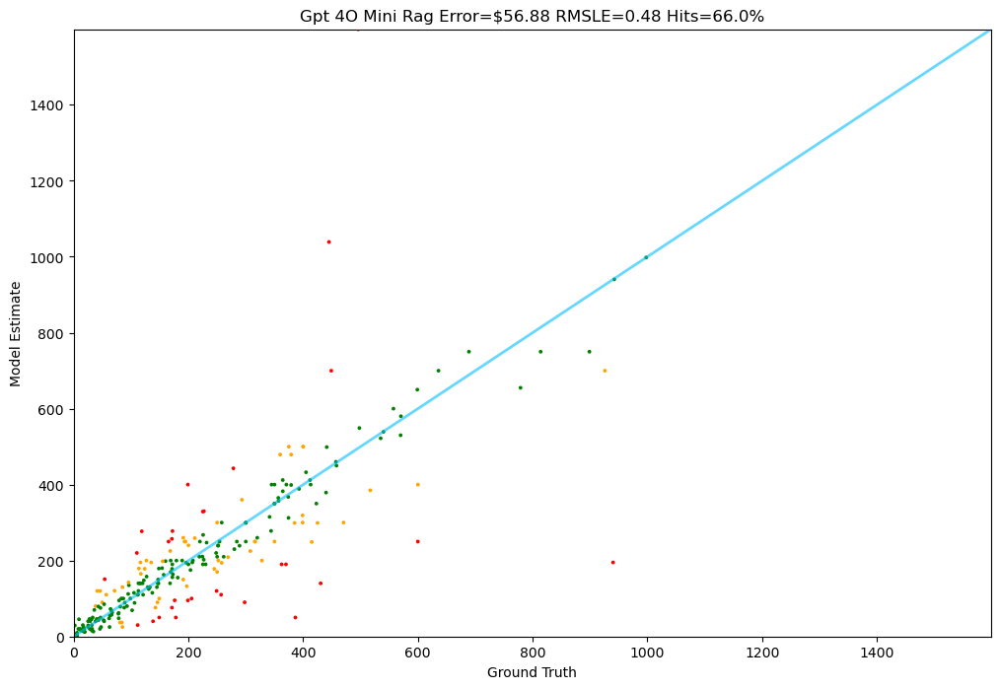

In [37]:
Tester.test(gpt_4o_mini_rag, test)

## Finishing off with Random Forests & Ensemble

In [38]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import joblib

In [40]:
result = collection.get(include=['embeddings', 'documents', 'metadatas'])
vectors = np.array(result['embeddings'])
documents = result['documents']
prices = [metadata['price'] for metadata in result['metadatas']]

In [41]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=4)
rf_model.fit(vectors, prices)

RandomForestRegressor(n_jobs=4, random_state=42)

In [42]:
# Save the model to a file

joblib.dump(rf_model, 'random_forest_model.pkl')

['random_forest_model.pkl']

In [43]:
# Load it back in again

rf_model = joblib.load('random_forest_model.pkl')

In [44]:
from agents.specialist_agent import SpecialistAgent
from agents.frontier_agent import FrontierAgent
from agents.random_forest_agent import RandomForestAgent

In [45]:
specialist = SpecialistAgent()
frontier = FrontierAgent(collection)
random_forest = RandomForestAgent()

In [46]:
def description(item):
    return item.prompt.split("to the nearest dollar?\n\n")[1].split("\n\nPrice is $")[0]

In [47]:
def rf(item):
    return random_forest.price(description(item))

1: Guess: $290.30 Truth: $374.41 Error: $84.11 SLE: 0.06 Item: OEM AC Compressor w/A/C Repair Kit For F...
2: Guess: $185.92 Truth: $225.11 Error: $39.19 SLE: 0.04 Item: Motorcraft YB3125 Fan Clutch
3: Guess: $254.84 Truth: $61.68 Error: $193.16 SLE: 1.98 Item: Dorman 603-159 Front Washer Fluid Reserv...
4: Guess: $333.05 Truth: $599.99 Error: $266.94 SLE: 0.34 Item: HP Premium 17.3-inch HD Plus Touchscreen...
5: Guess: $245.15 Truth: $16.99 Error: $228.16 SLE: 6.84 Item: 5-Position Super Switch Pickup Selector ...
6: Guess: $68.72 Truth: $31.99 Error: $36.73 SLE: 0.56 Item: Horror Bookmarks, Resin Horror Bookmarks...
7: Guess: $266.69 Truth: $101.79 Error: $164.90 SLE: 0.92 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...
8: Guess: $211.24 Truth: $289.00 Error: $77.76 SLE: 0.10 Item: Godox ML60Bi LED Light Kit, Handheld LED...
9: Guess: $329.04 Truth: $635.86 Error: $306.82 SLE: 0.43 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...
10: Guess: $170.82 Truth: $65.99 Error: $104.83 SLE

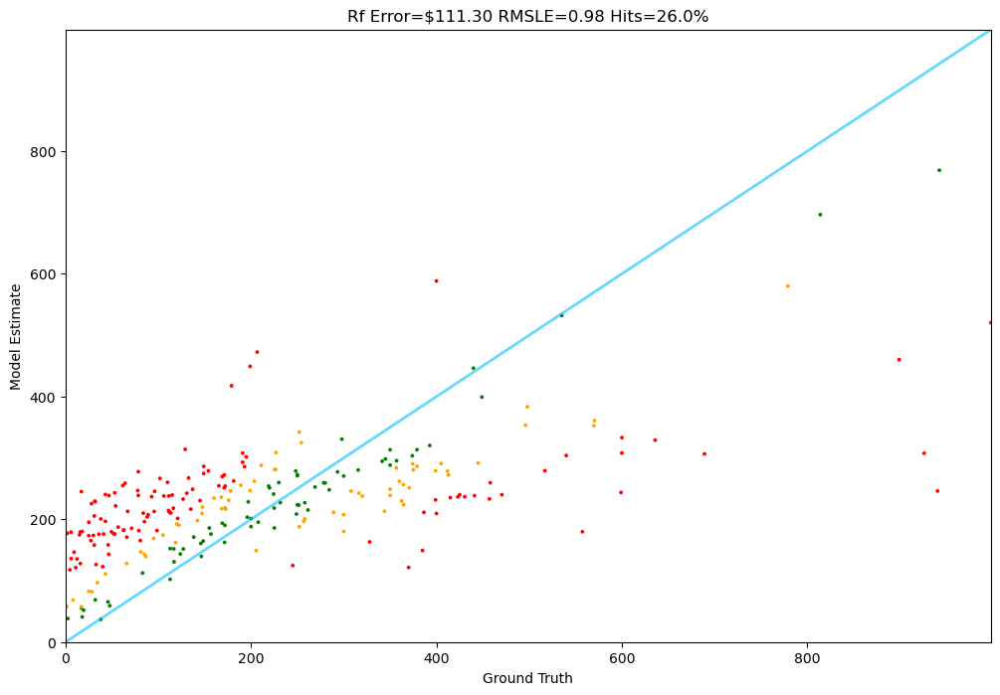

In [48]:
Tester.test(rf, test)

In [49]:
product = "Quadcast HyperX condenser mic for high quality audio for podcasting"

In [50]:
print(specialist.price(product))
print(frontier.price(product))
print(random_forest.price(product))

189.0
139.0
288.44780000000014


In [51]:
specialists = []
frontiers = []
random_forests = []
prices = []
for item in tqdm(test[1000:1250]):
    text = description(item)
    specialists.append(specialist.price(text))
    frontiers.append(frontier.price(text))
    random_forests.append(random_forest.price(text))
    prices.append(item.price)

100%|██████████| 250/250 [12:53<00:00,  3.09s/it]


In [53]:
import pandas as pd

mins = [min(s,f,r) for s,f,r in zip(specialists, frontiers, random_forests)]
maxes = [max(s,f,r) for s,f,r in zip(specialists, frontiers, random_forests)]

X = pd.DataFrame({
    'Specialist': specialists,
    'Frontier': frontiers,
    'RandomForest': random_forests,
    'Min': mins,
    'Max': maxes,
})

# Convert y to a Series
y = pd.Series(prices)

In [54]:
# Train a Linear Regression
np.random.seed(42)

lr = LinearRegression()
lr.fit(X, y)

feature_columns = X.columns.tolist()

for feature, coef in zip(feature_columns, lr.coef_):
    print(f"{feature}: {coef:.2f}")
print(f"Intercept={lr.intercept_:.2f}")

Specialist: 0.58
Frontier: 0.03
RandomForest: -0.30
Min: 0.49
Max: 0.24
Intercept=23.35


In [55]:
joblib.dump(lr, 'ensemble_model.pkl')

['ensemble_model.pkl']

In [56]:
from agents.ensemble_agent import EnsembleAgent
ensemble = EnsembleAgent(collection)

In [57]:
ensemble.price(product)

187.29753892524494

In [59]:
def ensemble_pricer(item):
    return ensemble.price(description(item))

1: Guess: $425.48 Truth: $374.41 Error: $51.07 SLE: 0.02 Item: OEM AC Compressor w/A/C Repair Kit For F...
2: Guess: $213.44 Truth: $225.11 Error: $11.67 SLE: 0.00 Item: Motorcraft YB3125 Fan Clutch
3: Guess: $41.42 Truth: $61.68 Error: $20.26 SLE: 0.15 Item: Dorman 603-159 Front Washer Fluid Reserv...
4: Guess: $397.02 Truth: $599.99 Error: $202.97 SLE: 0.17 Item: HP Premium 17.3-inch HD Plus Touchscreen...
5: Guess: $28.43 Truth: $16.99 Error: $11.44 SLE: 0.24 Item: 5-Position Super Switch Pickup Selector ...
6: Guess: $36.73 Truth: $31.99 Error: $4.74 SLE: 0.02 Item: Horror Bookmarks, Resin Horror Bookmarks...
7: Guess: $119.57 Truth: $101.79 Error: $17.78 SLE: 0.03 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...
8: Guess: $315.63 Truth: $289.00 Error: $26.63 SLE: 0.01 Item: Godox ML60Bi LED Light Kit, Handheld LED...
9: Guess: $884.73 Truth: $635.86 Error: $248.87 SLE: 0.11 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...
10: Guess: $71.93 Truth: $65.99 Error: $5.94 SLE: 0.01 It

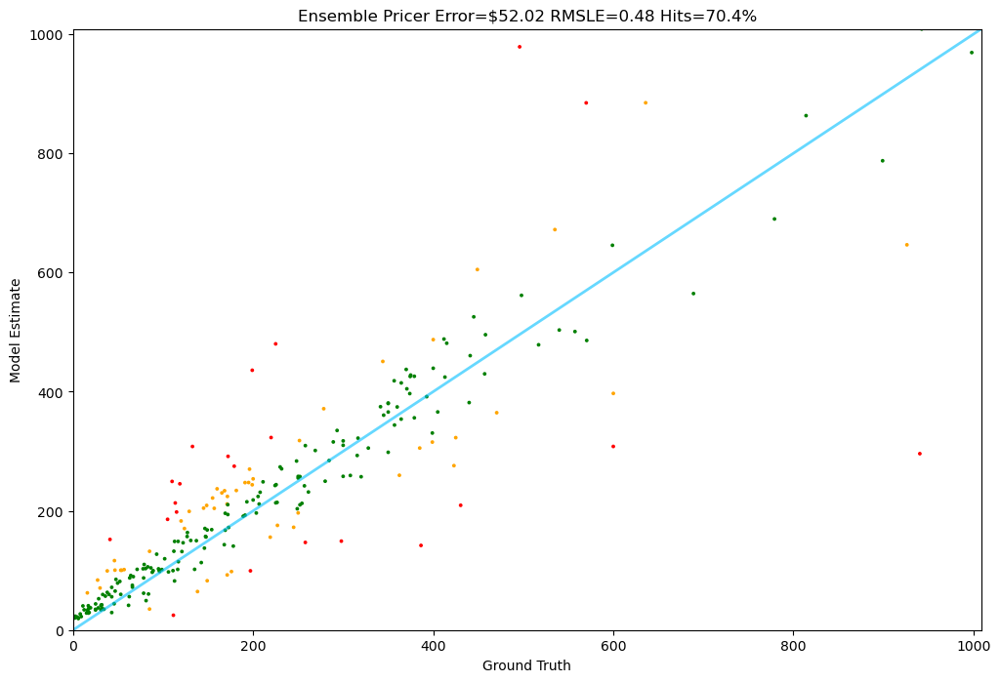

In [60]:
Tester.test(ensemble_pricer, test)